# Pocket Finder-Chart Atlas

This is the code to produce the finder charts for the [Pocket Finder-Chart Atlas](https://github.com/alanwatsonforster/pocket-finder-chart-atlas).



# Instructions

1. Upload the stellar catalog stars.fits.

2. Upload the object catalog object.csv.

3. Run this notebook.

4. Download and unpack charts.zip.


# Imports

In [5]:
import os

import math

import re

import numpy as np

from astropy.table import Table
from astropy import units as u
from astropy.coordinates import SkyCoord as sc

import matplotlib
from matplotlib import rc
import matplotlib.pyplot as plt
%matplotlib inline

# Astrometry

In [6]:
def coordinates_to_polar(c):
  r = centerc.separation(c).to(u.deg).value
  theta = centerc.position_angle(c).value - 1.5 * np.pi
  return r, theta

def polar_to_xy(r, theta):
  if chart_flipped:
    return -r * np.cos(theta), +r * np.sin(theta)
  else:
    return +r * np.cos(theta), +r * np.sin(theta)

# Stars

The stellar catalog is derived from the [Tycho-2 catalog](https://cdsarc.cds.unistra.fr/viz-bin/cat/I/259#/browse) at [CDS](https://cds.u-strasbg.fr). 

See also [the code](https://colab.research.google.com/drive/16JonQcoLPvneOuimvxtJOiUSpBR-Mixq?usp=sharing) used to prepare this catalog.

In [7]:
!FILEID=10jZUERbz5ljPUtvbGHJxcs_DZZgvhSq6; test -f stars.fits || wget --no-check-certificate "https://docs.google.com/uc?export=download&id=$FILEID" -O stars.fits
!ls
stars = Table.read("stars.fits")
print(stars.info)


objects.csv  sample_data  stars.fits
<Table length=329515>
 name  dtype  unit       description          class     n_bad 
----- ------- ---- ----------------------- ------------ ------
  TYC bytes12               TYC Identifier       Column      0
  HIP   int64               HIP Identifier MaskedColumn 220578
alpha float64  deg Right Ascension (J2000)       Column      0
delta float64  deg     Declination (J2000)       Column      0
  mag float64  mag            VT Magnitude       Column      0



# Objects

The objects catalog is read from the objects.csv file, which is itself produced from the objects-raw.csv file by running objects.sh.

In [8]:
objects = Table.read("objects.csv")
print(objects.info)

<Table length=258>
  name   dtype     class     n_bad
------- ------- ------------ -----
   # id    str4       Column     0
  alpha float64       Column     0
  delta float64       Column     0
    psa    str7       Column     0
      x float64       Column     0
      y float64       Column     0
     pa float64       Column     0
   type    str3       Column     0
  cat_M   int64 MaskedColumn   148
  cat_C   int64 MaskedColumn   149
  cat_U    str4 MaskedColumn   170
cat_NGC   str10 MaskedColumn    24
 cat_IC   int64 MaskedColumn   246
cat_Mel   int64 MaskedColumn   233
 cat_Cr   int64 MaskedColumn   238
   name   str28 MaskedColumn   182



# Chart Parameters

In [9]:
chart_limiting_magnitude = 9.5
chart_diameter = 4
chart_flipped = True

# Chart Data

In [10]:
def chart_record(name):
  if name[0] == "M":
    i = int(name[1:])
    return objects[objects["cat_M"] == i]
  elif name[0] == "C":
    i = int(name[1:])
    return objects[objects["cat_C"] == i]
  elif name[0] == "U":
    i = name[1:]
    return objects[objects["cat_U"] == i]
chart_record("U1")

def chart_alpha(name):
  return chart_record(name)["alpha"][0]

def chart_delta(name):
  return chart_record(name)["delta"][0]

def chart_title(name):
  record = chart_record(name)
  title = name;
  if name[0] != "M" and record["cat_M"][0] != "":
    title = title + " = M" + str(record["cat_M"][0])
  if name[0] != "C" and record["cat_C"][0] != "":
    title = title + " = C" + str(record["cat_C"][0])
  if name[0] != "U" and record["cat_U"][0] != "":
    title = title + " = U" + str(record["cat_U"][0])
  if record["cat_NGC"][0] != "":
    title = title + " = NGC " + str(record["cat_NGC"][0])
  elif record["cat_IC"][0] != "":
    title = title + " = IC " + str(record["cat_IC"][0])
  elif record["cat_Mel"][0] != "":
    title = title + " = Mel " + str(record["cat_Mel"][0])
  elif record["cat_Cr"][0] != "":
    title = title + " = Cr " + str(record["cat_Cr"][0])
  if record["name"][0] != "":
    title = title + " = " + str(record["name"][0])
  title = re.sub(r"\\omicron", "o", title)
  return title

# Chart Code

We produce both inline charts using matplotlib and LaTeX charts. The former are for debugging and initial quality control. The later are for production.

In [11]:
!mkdir -p png/ charts/

################################################################################

def plot_prolog(name, alpha=None, delta=None):

  if alpha == None:
    alpha = chart_alpha(name)
  if delta == None:
    delta = chart_delta(name)

  global centerc
  centerc = sc(alpha * u.deg, delta * u.deg, frame="icrs")

  plot_prolog_matplotlib(name)
  plot_prolog_latex(name)

def plot_prolog_matplotlib(name):
  global chart_fig, chart_ax  
  chart_fig, chart_ax = plt.subplots(1, 1, figsize=(8,8))

def plot_prolog_latex(name):
  global latex
  latex = open("charts/" + name + ".tex", "w")
  latex.write("\\begin{tikzpicture}[scale=\\chartscale/10]\n")

################################################################################

def plot_epilog(name):
  plot_epilog_matplotlib(name)
  plot_epilog_latex(name)

def plot_epilog_matplotlib(name):
  plt.savefig("png/" + name + ".png", dpi=150)
  plt.show()

def plot_epilog_latex(name):
  global latex
  latex.write("\\end{tikzpicture}\n")
  latex.close()

################################################################################

def plot_frame(title):
  plot_frame_matplotlib(title)
  plot_frame_latex(title)

def plot_frame_matplotlib(title):
  global chart_fig, chart_ax  
  plt.axis("equal")
  plt.xlim(-chart_diameter/2,+chart_diameter/2)
  plt.ylim(-chart_diameter/2,+chart_diameter/2)
  plt.title(title)
  plt.xticks([])
  plt.yticks([])

def plot_frame_latex(title):
  latex.write("\\drawframe{%s}{%.4f}\n" % (title, chart_diameter / 2))

################################################################################

def plot_radial_scale():
  plot_radial_scale_matplotlib()
  plot_radial_scale_latex()

def plot_radial_scale_matplotlib():
  theta = np.linspace(0, 2 * np.pi, 100)
  for d in range(1, int(chart_diameter) + 1):
    x = (d/2) * np.cos(theta)
    y = (d/2) * np.sin(theta)
    plt.plot(x, y, color='lightblue', linestyle='--', zorder=3)
    d += 1

def plot_radial_scale_latex():
  for d in range(1, int(chart_diameter) + 1):
    latex.write("\\drawradialscale{%.4f}\n" % (d / 2))

################################################################################

def plot_compass():
  plot_compass_matplotlib()
  plot_compass_latex()

def plot_compass_matplotlib():
  if chart_flipped:
    x = -(chart_diameter / 2 * 0.9)
  else:
    x = +(chart_diameter / 2 * 0.9)
  y = -(chart_diameter / 2 * 0.9)
  l = chart_diameter / 2 * 0.07
  plt.arrow(x, y, 0, l, length_includes_head=True, head_width=l/4)
  plt.text(x, y + l, 'N', ha='center', va='bottom')
  if chart_flipped:
    plt.arrow(x, y, l, 0, length_includes_head=True, head_width=l/4)
    plt.text(x + l, y, 'E', ha='left', va='center')
  else:
    plt.arrow(x, y, -l, 0, length_includes_head=True, head_width=l/4)
    plt.text(x - l, y, 'E', ha='right', va='center')

def plot_compass_latex():
  if chart_flipped:
    x = -(chart_diameter / 2 * 0.9)
  else:
    x = +(chart_diameter / 2 * 0.9)
  y = -(chart_diameter / 2 * 0.9)
  l = chart_diameter / 2 * 0.07
  if chart_flipped:
    latex.write("\\drawcompassflipped{%+.4f}{%+.4f}{%.4f}\n" % (x, y, l))
  else:
    latex.write("\\drawcompass{%+.4f}{%+.4f}{%.4f}\n" % (x, y, l))

################################################################################

def plot_stars():
  
  starsc = sc(np.array(stars["alpha"]) * u.deg, np.array(stars["delta"]) * u.deg, frame="icrs")

  mask = (starsc.separation(centerc) <= chart_diameter/2 * u.deg * math.sqrt(2)) & (stars["mag"] <= chart_limiting_magnitude)

  r, theta = coordinates_to_polar(starsc[mask])
  x, y = polar_to_xy(r, theta)

  mag = stars[mask]["mag"]

  plot_stars_mathplotlib(x, y, mag)
  plot_stars_latex(x, y, mag)

def plot_stars_mathplotlib(x, y, mag):
  s = 1 * ((10 - mag) ** 2)
  plt.scatter(x, y, s, c='black', zorder=4)

def plot_stars_latex(x, y, mag):
  for (x, y, mag) in zip(x, y, mag):
    latex.write("\\drawstar{%+.4f}{%+.4f}{%.4f}\n" % (x, y, (chart_limiting_magnitude - mag + 1) * 0.005))

################################################################################

def plot_object_latex(type, alpha, delta, major_axis, minor_axis, position_angle):
                      
  c = sc(alpha * u.deg, delta * u.deg)
  r, theta = coordinates_to_polar(c)
  x, y = polar_to_xy(r, theta)

  if type == "OC" or type == "GC" or type == "PN" or type == "BN" or type == "DN":
    diameter = major_axis
    if r - diameter / 2 > chart_diameter / 2 * math.sqrt(2):
      return
    latex.write("\draw%s{%+.4f}{%+.4f}{%.4f}\n" % (type, x, y, diameter / 2))
  elif type == "DS":
    diameter = 0.05 * chart_diameter
    if r - diameter / 2 > chart_diameter / 2 * math.sqrt(2):
      return
    latex.write("\draw%s{%+.4f}{%+.4f}{%.4f}\n" % (type, x, y, diameter / 2))
  elif type == "GAL" or type == "SC" or type == "AST":
    if r - major_axis / 2 > chart_diameter / 2 * math.sqrt(2):
      return
    if chart_flipped:
      latex.write("\draw%s{%+.4f}{%+.4f}{%.4f}{%.4f}{%.4f}\n" % (type, x, y, major_axis / 2, minor_axis / 2, -position_angle))
    else:
      latex.write("\draw%s{%+.4f}{%+.4f}{%.4f}{%.4f}{%.4f}\n" % (type, x, y, major_axis / 2, minor_axis / 2, +position_angle))

################################################################################

def plot_object_matplotlib(type, alpha, delta, major_axis, minor_axis, position_angle):

  if type == "OC":
    shape = "circle"
    line = "dotted"
    fill = "yellow"
    cross = None
  elif type == "GC":
    shape = "circle"
    line = "solid"
    fill = "yellow"
    cross = "inner"
  elif type == "PN":
    shape = "circle"
    line = "solid"
    fill = "yellowgreen"
    cross = "outer"
  elif type == "BN":
    shape = "circle"
    line = "solid"
    fill = "yellowgreen"
    cross = None
  elif type == "DN":
    shape = "circle"
    line = "dashed"
    fill = None
    cross = None
  elif type == "GAL":
    shape = "ellipse"
    line = "solid"
    fill = "red"
    cross = None
  elif type == "SC":
    shape = "ellipse"
    line = "dotted"
    fill = None
    cross = None
  elif type == "DS" or type == "AST":
    shape = "cross"
    line = "solid"
    fill = None
    cross = None
  else:
    print("unknown type: " + type)

  if shape == "circle":
    minor_axis = major_axis
    position_angle = 0
    shape = "ellipse"

  if fill == None:
    fc = "white"
    fill = False
  else:
    fc = fill
    fill = True

  c = sc(alpha * u.deg, delta * u.deg)
  r, theta = coordinates_to_polar(c)
  x, y = polar_to_xy(r, theta)

  if r - major_axis > chart_diameter / 2 * math.sqrt(2):
    return

  if cross == "outer":
    l = major_axis
    plt.plot([x-l,x+l],[y,y], 'k-', linewidth=2, zorder=-1)
    plt.plot([x,x],[y-l,y+l], 'k-', linewidth=2, zorder=-1)

  if cross == "inner":
    l = major_axis / 2
    plt.plot([x-l,x+l],[y,y], 'k-', linewidth=2, zorder=3)
    plt.plot([x,x],[y-l,y+l], 'k-', linewidth=2, zorder=3)

  if line == "dotted":
    linestyle = ":"
    linecolor = "grey"
  elif line == "dashed":
    linestyle = "--"
    linecolor = "grey"
  else:
    linestyle = "-"
    linecolor = "black"

  if shape == "cross":
    l = major_axis / math.sqrt(2)
    plt.plot([x-l,x+l],[y-l,y+l], 'k-', linewidth=1, zorder=3)
    plt.plot([x+l,x-l],[y-l,y+l], 'k-', linewidth=1, zorder=3)
  else:
    patch = matplotlib.patches.Ellipse((x, y), minor_axis, major_axis, angle=-position_angle, fill=fill, fc=fc, edgecolor=linecolor, linestyle=linestyle, linewidth=2, zorder=1)
    plt.gca().add_patch(patch)

################################################################################

def plot_object(type, alpha, delta, x, y, pa):
  plot_object_matplotlib(type, alpha, delta, x, y, pa)
  plot_object_latex(type, alpha, delta, x, y, pa)

def plot_objects():
  for i in range(len(objects)):
    type  = objects["type"][i]
    if type == "BN":
      alpha = objects["alpha"][i]
      delta = objects["delta"][i]
      major_axis = objects["x"][i] / 60
      minor_axis = objects["y"][i]
      if minor_axis == 0:
        minor_axis = major_axis
      else:
        minor_axis = float(minor_axis) / 60
      position_angle = objects["pa"][i]
      plot_object(type, alpha, delta, major_axis, minor_axis, position_angle)
    if type != "FC":
      alpha = objects["alpha"][i]
      delta = objects["delta"][i]
      major_axis = objects["x"][i] / 60
      minor_axis = objects["y"][i]
      if minor_axis == 0:
        minor_axis = major_axis
      else:
        minor_axis = float(minor_axis) / 60
      position_angle = objects["pa"][i]
      plot_object(type, alpha, delta, major_axis, minor_axis, position_angle)

################################################################################

def plot_chart(name):
  plot_prolog(name)
  plot_frame(chart_title(name))
  plot_objects()
  plot_radial_scale()
  plot_stars()
  plot_compass()
  plot_epilog(name)

# Messier Objects

mkdir: cannot create directory ‘charts/’: File exists


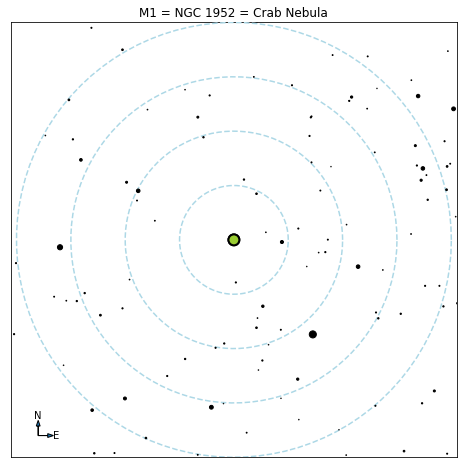

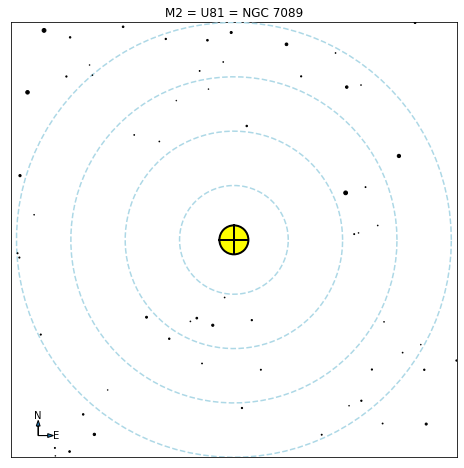

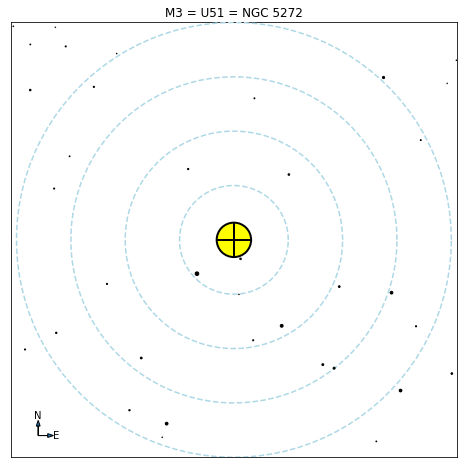

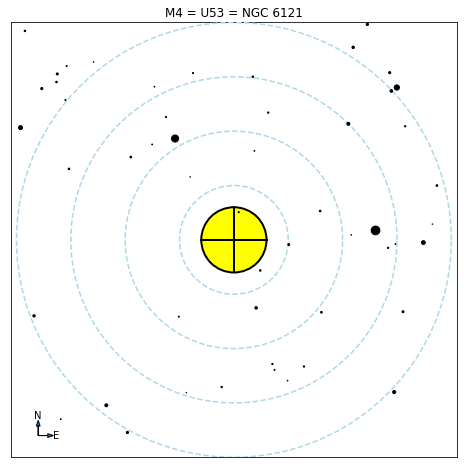

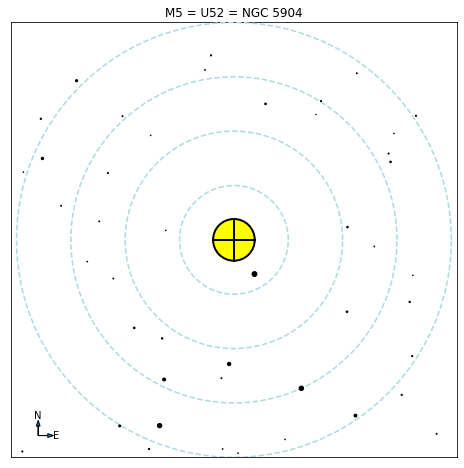

...

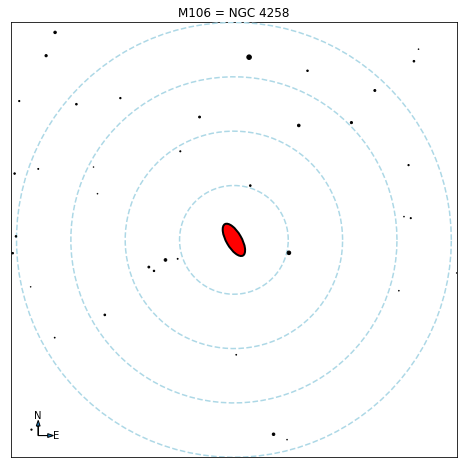

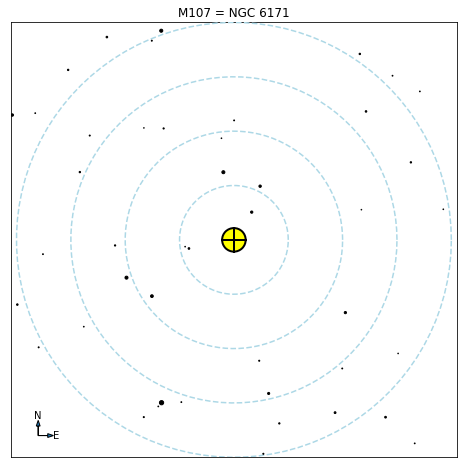

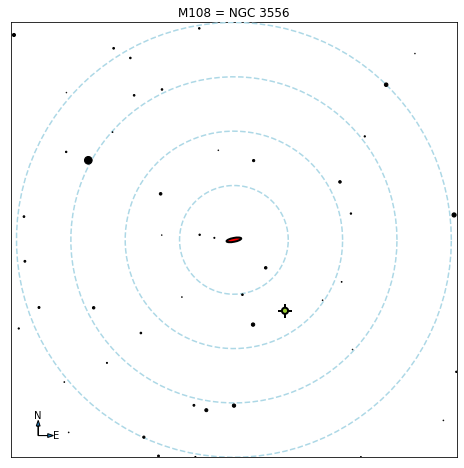

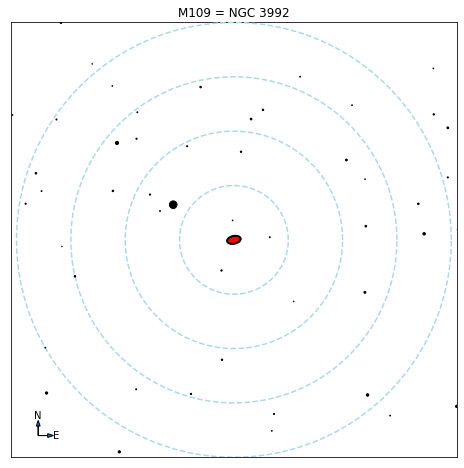

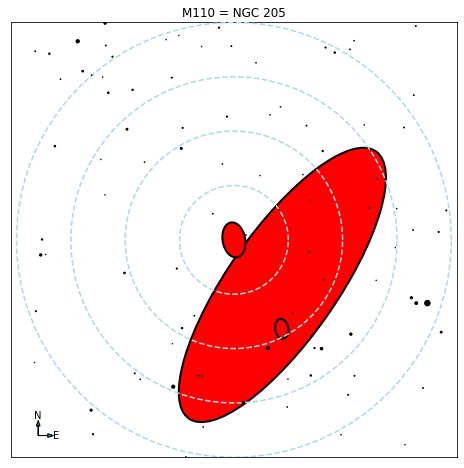

  adding: charts/ (stored 0%)
  adding: charts/M48.tex (deflated 72%)
  adding: charts/M25.tex (deflated 72%)
  adding: charts/M80.tex (deflated 70%)
  adding: charts/M71.tex (deflated 72%)
  adding: charts/M69.tex (deflated 72%)
  adding: charts/M39.tex (deflated 72%)
  adding: charts/M70.tex (deflated 71%)
  adding: charts/M41.tex (deflated 72%)
  adding: charts/M57.tex (deflated 72%)
  adding: charts/M55.tex (deflated 70%)
  adding: charts/M72.tex (deflated 70%)
  adding: charts/M42.tex (deflated 72%)
  adding: charts/M53.tex (deflated 68%)
  adding: charts/M101.tex (deflated 68%)
  adding: charts/M31.tex (deflated 70%)
  adding: charts/M34.tex (deflated 72%)
  adding: charts/M30.tex (deflated 69%)
  adding: charts/M75.tex (deflated 69%)
  adding: charts/M91.tex (deflated 67%)
  adding: charts/M96.tex (deflated 67%)
  adding: charts/M63.tex (deflated 65%)
  adding: charts/M59.tex (deflated 68%)
  adding: charts/M28.tex (deflated 71%)
  adding: charts/M104.tex (deflated 68%)
  adding

In [12]:
!mkdir p charts/
if True:
  for i in range(1, 111):
    name = "M%d" % i
    plot_chart(name)
!rm -f charts.zip; zip -r charts.zip charts/

# Caldwell Objects

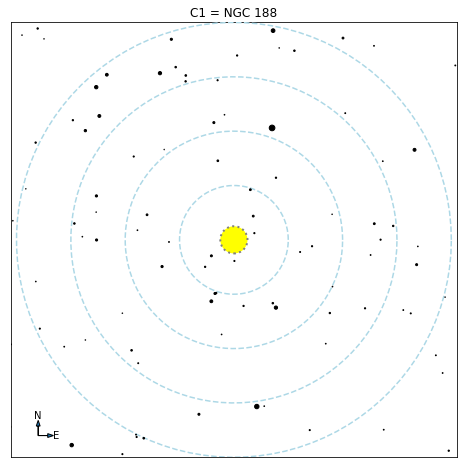

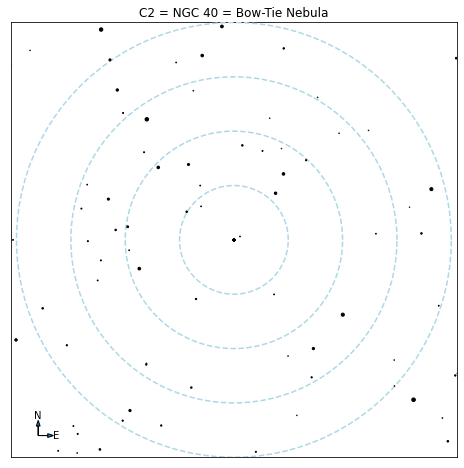

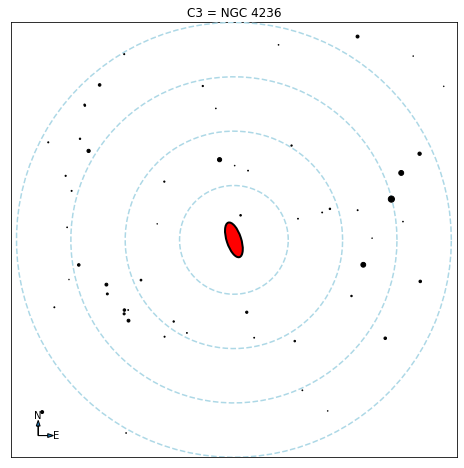

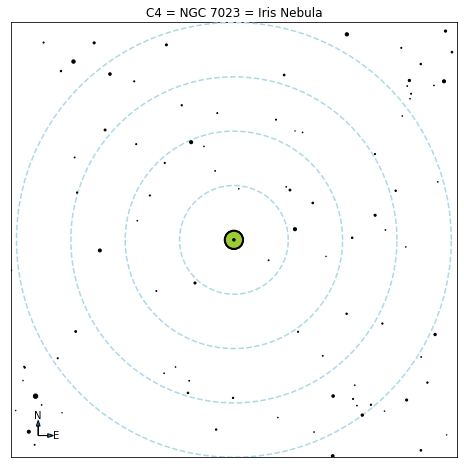

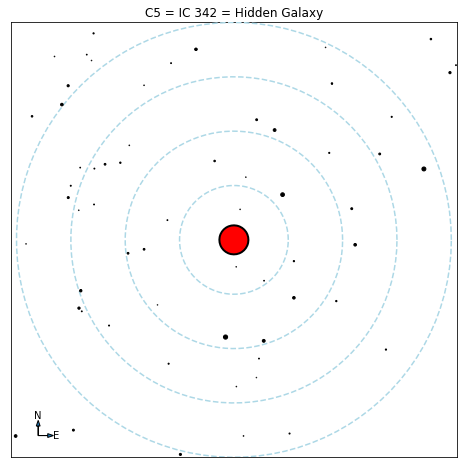

...

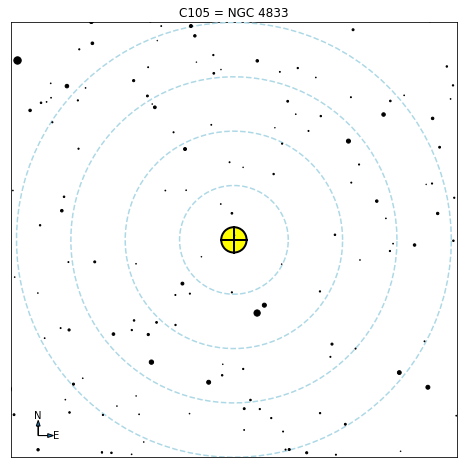

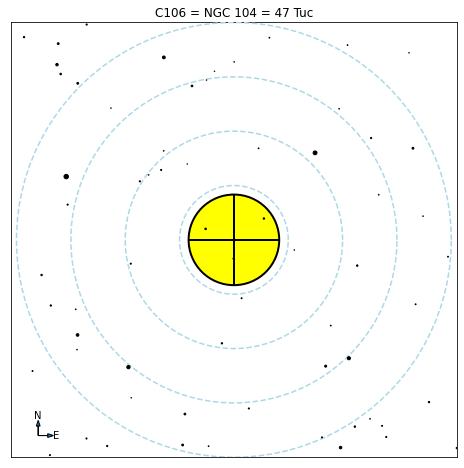

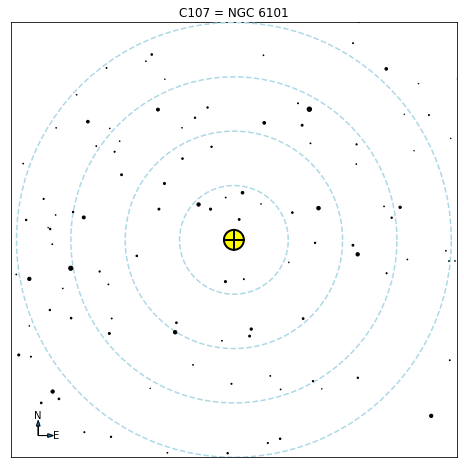

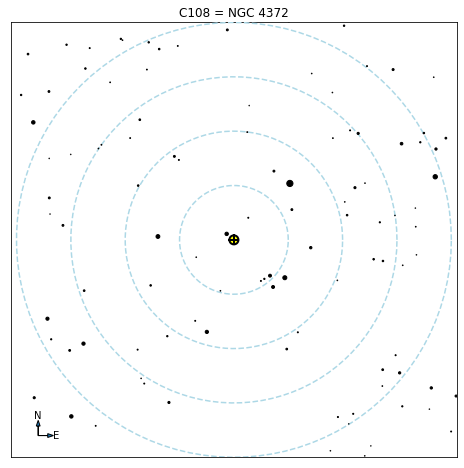

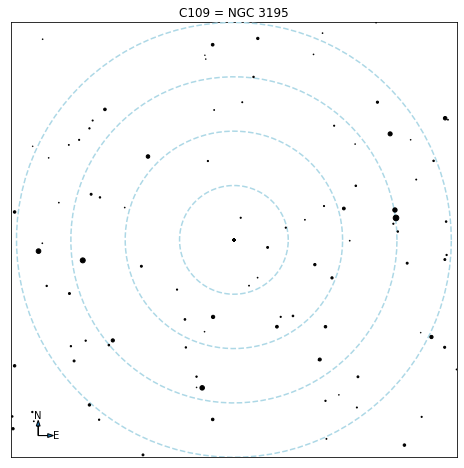

  adding: charts/ (stored 0%)
  adding: charts/C7.tex (deflated 70%)
  adding: charts/C97.tex (deflated 73%)
  adding: charts/M48.tex (deflated 72%)
  adding: charts/C87.tex (deflated 69%)
  adding: charts/C1.tex (deflated 71%)
  adding: charts/C36.tex (deflated 68%)
  adding: charts/M25.tex (deflated 72%)
  adding: charts/C39.tex (deflated 71%)
  adding: charts/C56.tex (deflated 68%)
  adding: charts/M80.tex (deflated 70%)
  adding: charts/C63.tex (deflated 68%)
  adding: charts/C19.tex (deflated 72%)
  adding: charts/M71.tex (deflated 72%)
  adding: charts/C86.tex (deflated 72%)
  adding: charts/M69.tex (deflated 72%)
  adding: charts/C92.tex (deflated 74%)
  adding: charts/M39.tex (deflated 72%)
  adding: charts/C35.tex (deflated 68%)
  adding: charts/M70.tex (deflated 71%)
  adding: charts/M41.tex (deflated 72%)
  adding: charts/C102.tex (deflated 72%)
  adding: charts/C46.tex (deflated 72%)
  adding: charts/M57.tex (deflated 72%)
  adding: charts/C73.tex (deflated 69%)
  adding: c

In [13]:
!mkdir -p charts/
if True:
  for i in range(1, 110):
    name = "C%d" % i
    plot_chart(name)
!rm -f charts.zip; zip -r charts.zip charts/

# Urban Observing Program Objects

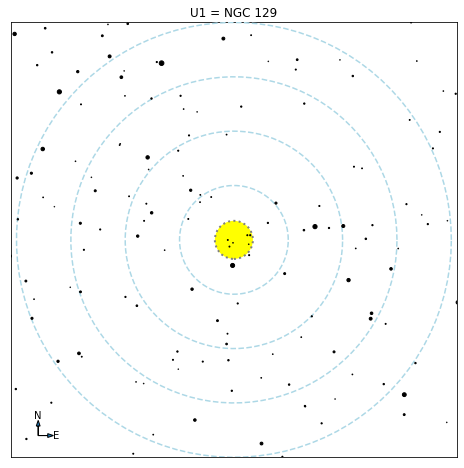

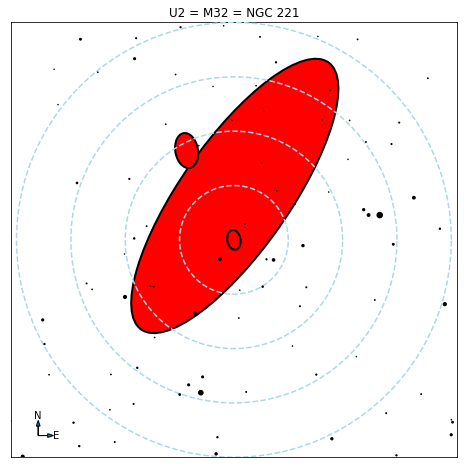

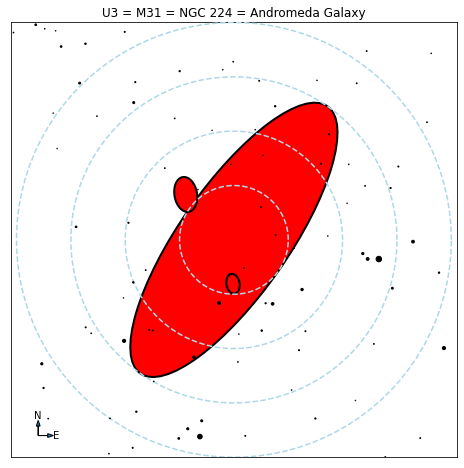

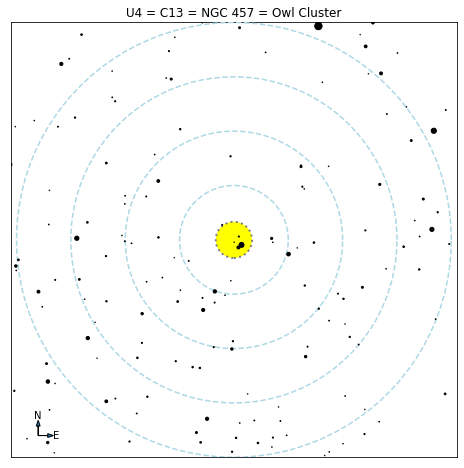

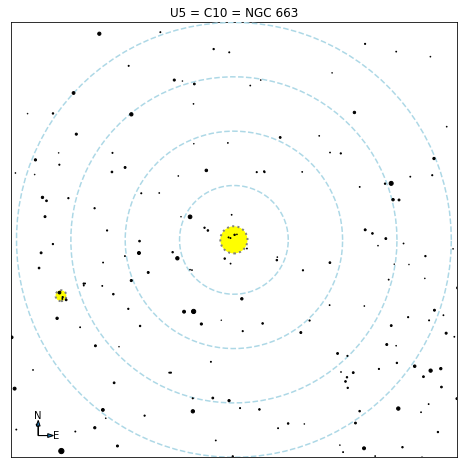

...

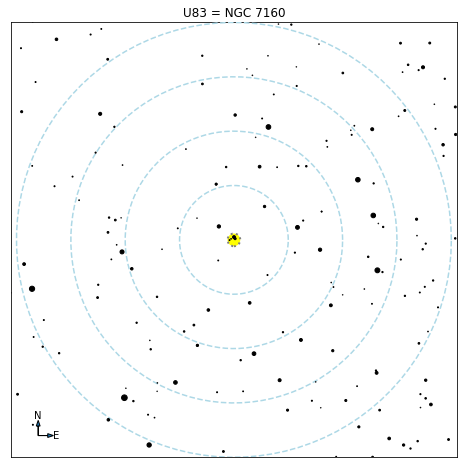

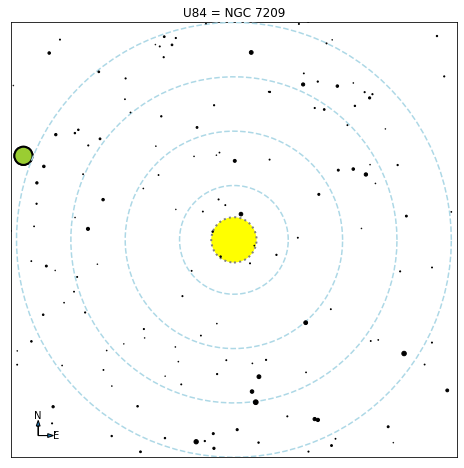

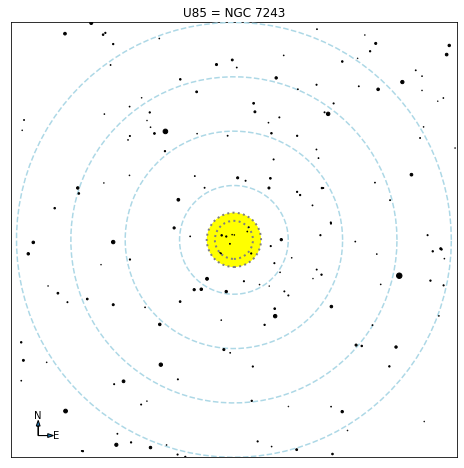

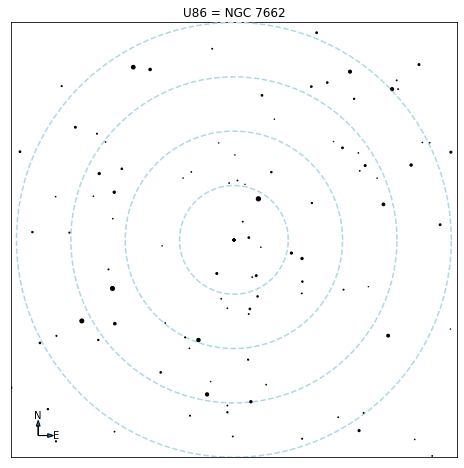

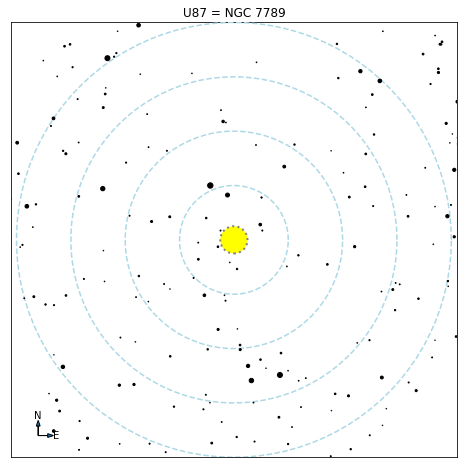

  adding: charts/ (stored 0%)
  adding: charts/C7.tex (deflated 70%)
  adding: charts/C97.tex (deflated 73%)
  adding: charts/M48.tex (deflated 72%)
  adding: charts/C87.tex (deflated 69%)
  adding: charts/C1.tex (deflated 71%)
  adding: charts/C36.tex (deflated 68%)
  adding: charts/U58.tex (deflated 72%)
  adding: charts/M25.tex (deflated 72%)
  adding: charts/C39.tex (deflated 71%)
  adding: charts/C56.tex (deflated 68%)
  adding: charts/M80.tex (deflated 70%)
  adding: charts/C63.tex (deflated 68%)
  adding: charts/C19.tex (deflated 72%)
  adding: charts/M71.tex (deflated 72%)
  adding: charts/U33.tex (deflated 72%)
  adding: charts/U45.tex (deflated 67%)
  adding: charts/C86.tex (deflated 72%)
  adding: charts/U6.tex (deflated 70%)
  adding: charts/U18.tex (deflated 70%)
  adding: charts/U30.tex (deflated 72%)
  adding: charts/M69.tex (deflated 72%)
  adding: charts/U3.tex (deflated 70%)
  adding: charts/U38.tex (deflated 72%)
  adding: charts/C92.tex (deflated 74%)
  adding: char

In [14]:
!mkdir -p charts/
if True:
  for i in range(1, 88):
    name = "U%d" % i
    plot_chart(name)
!rm -f charts.zip; zip -r charts.zip charts/